In [2]:
import cv2
import os
import numpy as np
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from scipy.signal import medfilt2d
import matplotlib.pyplot as plt
from PIL import Image

In [3]:
# Augmentation functions
def flip(image):
    return cv2.flip(image, random.choice([0, 1]))  # 0: horizontal flip, 1: vertical flip

def crop(image, crop_size=(100, 100)):
    h, w = image.shape[:2]
    x = random.randint(0, w - crop_size[0])
    y = random.randint(0, h - crop_size[1])
    return image[y:y+crop_size[1], x:x+crop_size[0]]

def rotate(image, angle_range=(-15, 15)):
    angle = random.randint(angle_range[0], angle_range[1])
    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(image, rotation_matrix, (w, h))

def color_adjustment(image, brightness_range=(-50, 50)):
    brightness = random.randint(brightness_range[0], brightness_range[1])
    adjusted_image = np.clip(image.astype(np.int16) + brightness, 0, 255).astype(np.uint8)
    return adjusted_image

def increase_sharpness(image):
    kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]], dtype=np.float32)  # Sharpening kernel
    sharpened_image = cv2.filter2D(image, -1, kernel)
    return sharpened_image

def random_erasing(image, probability=0.5, min_area=0.02, max_area=0.4, min_aspect_ratio=0.3, max_aspect_ratio=3):
    if random.random() > probability:
        return image
    
    h, w = image.shape[:2]
    area = random.uniform(min_area, max_area) * h * w
    aspect_ratio = random.uniform(min_aspect_ratio, max_aspect_ratio)
    erase_h = int(round(np.sqrt(area * aspect_ratio)))
    erase_w = int(round(np.sqrt(area / aspect_ratio)))
    
    x = random.randint(0, w - erase_w)
    y = random.randint(0, h - erase_h)
    
    noise = np.random.randint(0, 256, size=(erase_h, erase_w, image.shape[2]), dtype=np.uint8)
    image[y:y+erase_h, x:x+erase_w] = noise
    return image

def median_filtering(image):
    # Separate color channels
    red_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 2]

    # Apply median filtering to each channel
    filtered_red_channel = medfilt2d(red_channel, kernel_size=3)
    filtered_green_channel = medfilt2d(green_channel, kernel_size=3)
    filtered_blue_channel = medfilt2d(blue_channel, kernel_size=3)

    # Combine filtered channels back into an image
    filtered_image_array = np.stack((filtered_red_channel, filtered_green_channel, filtered_blue_channel), axis=-1)

    return filtered_image_array

#contrast enhancement
def contrast_enhancement(image):
    # Convert image to HSV color space
    hsv = cv2.cvtColor(image.astype(np.uint8), cv2.COLOR_BGR2HSV)  # Cast for OpenCV

    # Split channels (Hue, Saturation, Value)
    h, s, v = cv2.split(hsv)

    # Equalize the value channel
    v_eq = cv2.equalizeHist(v)

    # Combine channels back to HSV
    hsv_equalized = cv2.merge((h, s, v_eq))

    # Convert back to RGB
    image_equalized = cv2.cvtColor(hsv_equalized, cv2.COLOR_HSV2BGR)

    return image_equalized
  


In [4]:
# Define an ImageDataGenerator
data_generator = ImageDataGenerator(
    preprocessing_function=lambda img: img,
    rescale=1./255  # Rescale pixel values to [0, 1]
)

In [5]:
# Directory paths
input_train_directory = 'dataset/train'
output_train_directory = 'dataset/preprocessed/train'

output_nowildfire_train_directory = 'dataset/preprocessed/train/nowildfire'
output_wildfire_train_directory = 'dataset/preprocessed/train/wildfire'

input_valid_directory = 'dataset/valid'
output_nowildfire_valid_directory = 'dataset/preprocessed/valid/nowildfire'
output_wildfire_valid_directory = 'dataset/preprocessed/valid/wildfire'

In [6]:
# List all files in the directory
subfolders = os.listdir(input_train_directory)

In [7]:
subfolders

['nowildfire', 'wildfire']

In [7]:
nowildfire_train_path = input_train_directory + "/" + subfolders[0]
wildfire_train_path = input_train_directory + "/" + subfolders[1]

In [8]:
nowildfire_valid_path = input_valid_directory + "/" + subfolders[0]
wildfire_valid_path = input_valid_directory + "/" + subfolders[1]

In [9]:
nowildfire_train_path

'dataset/train/nowildfire'

In [10]:
wildfire_train_path

'dataset/train/wildfire'

In [11]:
nowildfire_files = os.listdir(nowildfire_train_path)

In [12]:
wildfire_files = os.listdir(wildfire_train_path)

In [13]:
nowildfire_files

['-113.917243,51.101323.jpg',
 '-113.917264,50.966686.jpg',
 '-113.917465,51.051057.jpg',
 '-113.917555,51.071225.jpg',
 '-113.917557,51.165343.jpg',
 '-113.917675,51.136583.jpg',
 '-113.917733,50.908707.jpg',
 '-113.91774,50.982371.jpg',
 '-113.91787,51.069856.jpg',
 '-113.917915,50.952588.jpg',
 '-113.918098,50.962694.jpg',
 '-113.918145,50.925384.jpg',
 '-113.918213,50.96612.jpg',
 '-113.91823,50.90175.jpg',
 '-113.918231,50.982736.jpg',
 '-113.918272,51.150254.jpg',
 '-113.918307,50.973625.jpg',
 '-113.918347,51.097737.jpg',
 '-113.918463,50.954355.jpg',
 '-113.918488,51.163727.jpg',
 '-113.918522,50.941109.jpg',
 '-113.918658,50.953348.jpg',
 '-113.918729,50.905488.jpg',
 '-113.918739,51.023973.jpg',
 '-113.91887,51.095763.jpg',
 '-113.918882,50.914393.jpg',
 '-113.918887,50.941984.jpg',
 '-113.918944,50.943061.jpg',
 '-113.919071,51.024865.jpg',
 '-113.919082,51.019757.jpg',
 '-113.919298,51.01059.jpg',
 '-113.919314,50.915823.jpg',
 '-113.919333,51.04345.jpg',
 '-113.919371,51.0

No wildfire preprocessing

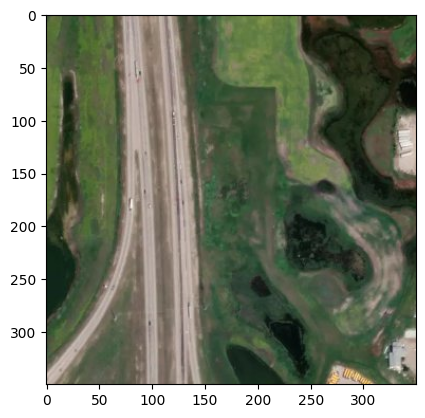

In [14]:
 # Construct the full file path
file_path = os.path.join(nowildfire_train_path, nowildfire_files[0])

# Load the image using PIL
image = Image.open(file_path)


plt.imshow(image)
# image.show()

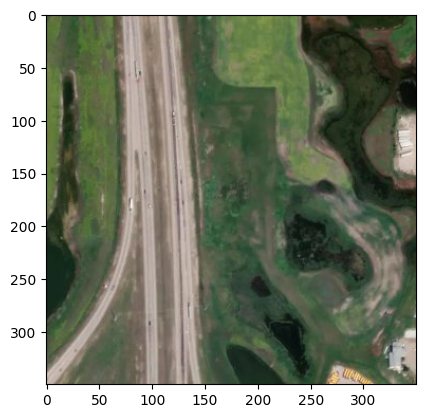

In [15]:
image_array = np.array(image)
preprocessing_img = color_adjustment(image_array)

plt.imshow(preprocessing_img)

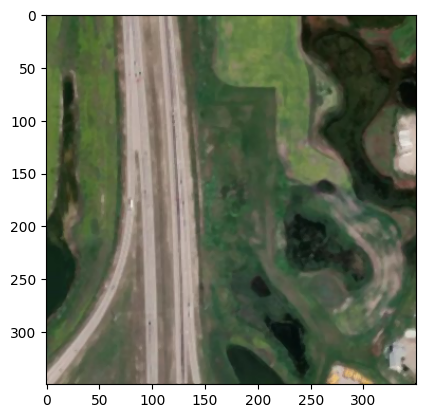

In [16]:
image_array = np.array(image)
preprocessing_img = median_filtering(image_array)

plt.imshow(preprocessing_img)

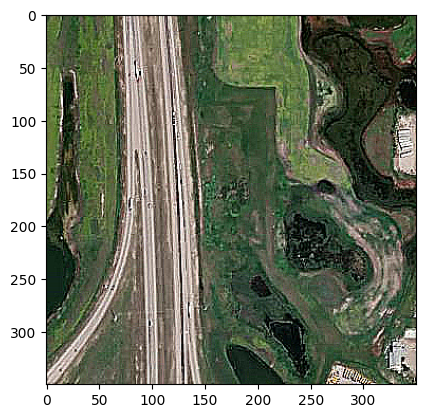

In [17]:
image_array = np.array(image)
preprocessing_img = increase_sharpness(image_array)

plt.imshow(preprocessing_img)

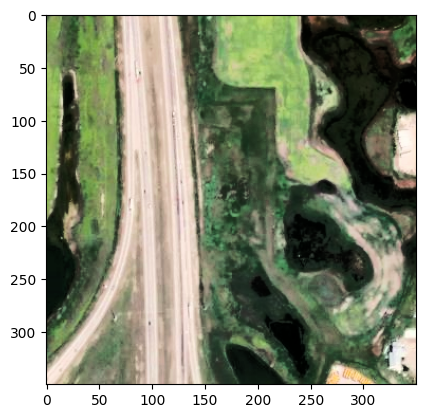

In [18]:
image_array = np.array(image)
preprocessing_img = contrast_enhancement(image_array)

plt.imshow(preprocessing_img)

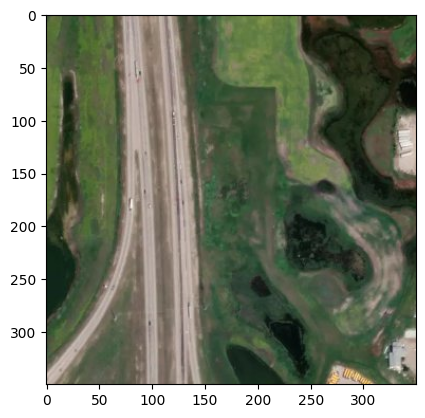

In [19]:
image_array = np.array(image)
preprocessing_img = random_erasing(image_array)

plt.imshow(preprocessing_img)

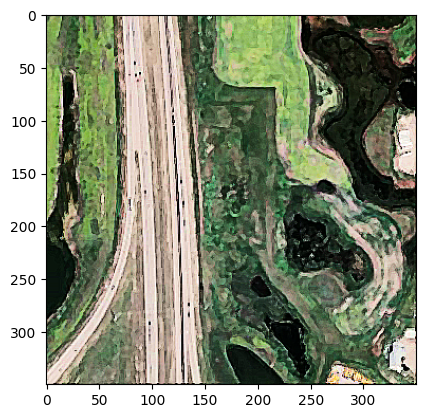

In [20]:
image_array = np.array(image)
preprocessing_img = random_erasing(contrast_enhancement(increase_sharpness(median_filtering(color_adjustment(image_array)))))

plt.imshow(preprocessing_img)

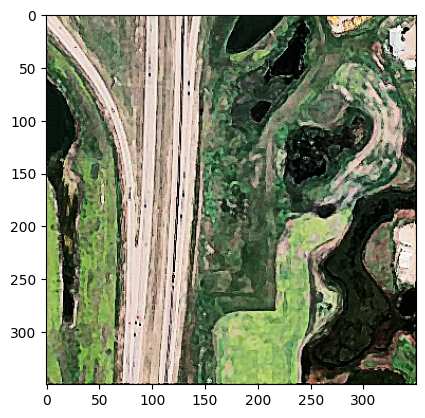

In [21]:
preprocessing_image_array = np.array(preprocessing_img)

augmented_img = flip(preprocessing_image_array)

plt.imshow(augmented_img)

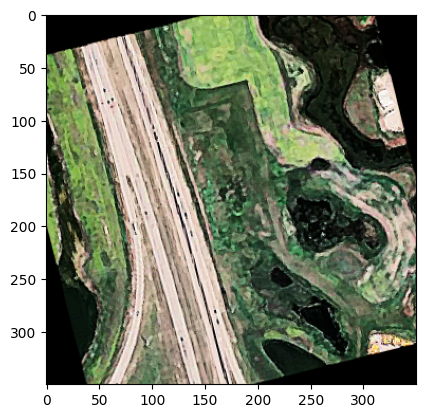

In [22]:
preprocessing_image_array = np.array(preprocessing_img)

augmented_img = rotate(preprocessing_image_array)

plt.imshow(augmented_img)

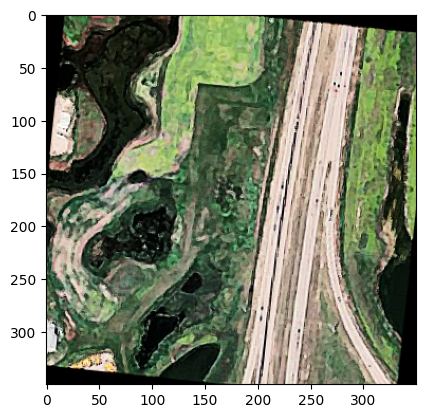

In [23]:
preprocessing_image_array = np.array(preprocessing_img)

augmented_img = rotate((flip(preprocessing_image_array)))

plt.imshow(augmented_img)

Wildfire preprocessing

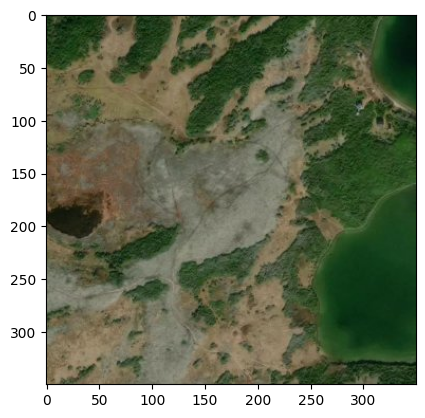

In [24]:
# Construct the full file path
file_path = os.path.join(wildfire_train_path, wildfire_files[0])

# Load the image using PIL
image = Image.open(file_path)


plt.imshow(image)
# image.show()

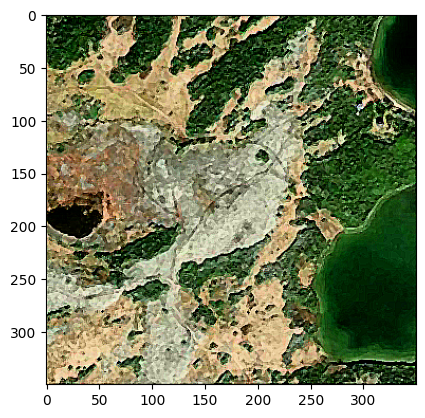

In [25]:
image_array = np.array(image)
preprocessing_img = random_erasing(contrast_enhancement(increase_sharpness(median_filtering(color_adjustment(image_array)))))

plt.imshow(preprocessing_img)

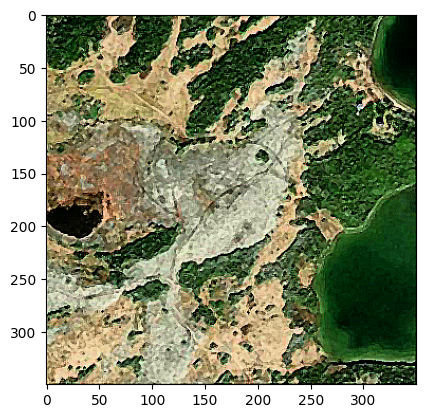

In [26]:
image_array = np.array(image)
preprocessing_img = contrast_enhancement(increase_sharpness(median_filtering(color_adjustment(image_array))))

plt.imshow(preprocessing_img)

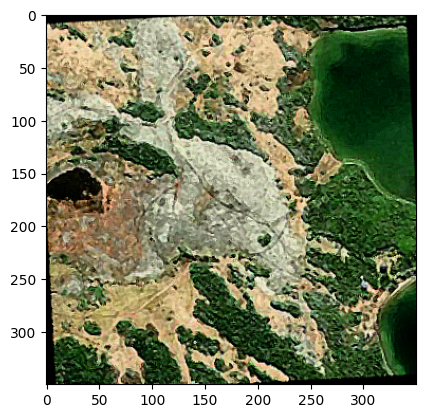

In [27]:
preprocessing_image_array = np.array(preprocessing_img)

augmented_img = rotate((flip(preprocessing_image_array)))

plt.imshow(augmented_img)

In [28]:
input_folders = [nowildfire_train_path, wildfire_train_path, nowildfire_valid_path, wildfire_valid_path]

In [29]:
output_folders = [output_nowildfire_train_directory, output_wildfire_train_directory, output_nowildfire_valid_directory, output_wildfire_valid_directory]

In [30]:
for folder in output_folders:
  if not os.path.exists(folder):
      os.makedirs(folder)


Preprocessing Training and Validation set

In [42]:
import cv2

In [46]:
# Loop through all files in the input folder

for input_folder in input_folders:
  print(input_folder)
  for filename in os.listdir(input_folder):
      if filename.lower().endswith((".jpg", ".jpeg", ".png")):  # Check for image extensions
        # Get full path of the image
        image_path = os.path.join(input_folder, filename)

        image = cv2.imread(image_path)

        image_array = np.array(image)

        preprocessed_img = contrast_enhancement(increase_sharpness(median_filtering(color_adjustment(image_array))))

        augmented_img = rotate((flip(preprocessed_img)))

        # Create the output filename with the same name (optional)
        output_filename = "processed" + filename

        # Save the preprocessed image
        if input_folder.__contains__("train"):
          if input_folder.__contains__("nowildfire"):
              output_path = os.path.join(output_folders[0], output_filename)
          else: 
              output_path = os.path.join(output_folders[1], output_filename)
        if input_folder.__contains__("valid"):
          if input_folder.__contains__("nowildfire"):
              output_path = os.path.join(output_folders[2], output_filename)
          else: 
              output_path = os.path.join(output_folders[3], output_filename)
        
        cv2.imwrite(output_path, augmented_img)

        print(f"Image processed and saved: {output_path}")

dataset/train/nowildfire
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-113.917243,51.101323.jpg
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-113.917264,50.966686.jpg
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-113.917465,51.051057.jpg
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-113.917555,51.071225.jpg
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-113.917557,51.165343.jpg
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-113.917675,51.136583.jpg
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-113.917733,50.908707.jpg
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-113.91774,50.982371.jpg
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-113.91787,51.069856.jpg
Image processed and saved: dataset/preprocessed/train/nowildfire\processed-11

Preprocessing Testing set

In [10]:
nowildfire_test_path = "dataset/test/nowildfire"

wildfire_test_path = "dataset/test/wildfire"

input_folders = [nowildfire_test_path, wildfire_test_path]

output_nowildfire_test_directory = "dataset/preprocessed/test/nowildfire"

output_wildfire_test_directory = "dataset/preprocessed/test/wildfire"

output_folders = [output_nowildfire_test_directory, output_wildfire_test_directory]

for folder in output_folders:
  if not os.path.exists(folder):
      os.makedirs(folder)


for input_folder in input_folders:
  print(input_folder)
  for filename in os.listdir(input_folder):
      if filename.lower().endswith((".jpg", ".jpeg", ".png")):  # Check for image extensions
        # Get full path of the image
        image_path = os.path.join(input_folder, filename)

        image = cv2.imread(image_path)

        image_array = np.array(image)

        preprocessed_img = contrast_enhancement(increase_sharpness(median_filtering(color_adjustment(image_array))))

        augmented_img = rotate((flip(preprocessed_img)))

        # Create the output filename with the same name (optional)
        output_filename = "processed" + filename

        # Save the preprocessed image
        if input_folder.__contains__("test"):
          if input_folder.__contains__("nowildfire"):
              output_path = os.path.join(output_folders[0], output_filename)
          else: 
              output_path = os.path.join(output_folders[1], output_filename)
   
        cv2.imwrite(output_path, augmented_img)

        print(f"Image processed and saved: {output_path}")

dataset/test/nowildfire
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.91777,50.901087.jpg
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.91782,50.896917.jpg
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.91793,51.091205.jpg
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.918016,50.978447.jpg
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.918155,51.129969.jpg
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.918231,51.154481.jpg
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.91831,51.088925.jpg
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.918315,51.112177.jpg
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.918547,51.114526.jpg
Image processed and saved: dataset/preprocessed/test/nowildfire\processed-113.918624,51.1